#### Comparing the gene signatures across three fetal stem cells populations and LGR5 stem cells from Ishikawa, 2022 study
- **Developed by:** Anna Maguza
- **Affilation:** Faculty of Medicine, Würzburg University
- **Date of creation:** 4th October 2024
- **Last modified date:** 4th October 2024

This notebook is created to compare three fetal stem cells populations and LGR5+ cells to identify are there some shared gene signatures.

+ Import packages

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np

In [2]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

### Analyze signatures of Ishikawa, 2022 stem cells

+ Load Ishikawa object

In [3]:
adult_adata = sc.read_h5ad("data/Ishikawa_2022/Ishikawa_2022_raw_filtered.h5ad")

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [5]:
adult_adata_copy = adult_adata.copy()
sc.pp.normalize_total(adult_adata, target_sum = 1e6, exclude_highly_expressed = True) #1e6 because it is 10X
sc.pp.log1p(adult_adata)

In [6]:
adult_adata.var

,gene_id,gene_name,gene_type
0,ENSG00000243485,MIR1302-2HG,Gene Expression
1,ENSG00000237613,FAM138A,Gene Expression
2,ENSG00000186092,OR4F5,Gene Expression
3,ENSG00000238009,AL627309.1,Gene Expression
4,ENSG00000239945,AL627309.3,Gene Expression
...,...,...,...
33533,ENSG00000277856,AC233755.2,Gene Expression
33534,ENSG00000275063,AC233755.1,Gene Expression
33535,ENSG00000271254,AC240274.1,Gene Expression
33536,ENSG00000277475,AC213203.1,Gene Expression


In [7]:
adult_adata.var.index = adult_adata.var['gene_name'].copy()

In [8]:
stem_cells_features = ['LGR5', 'SMOC2', 'ASCL2', 'AXIN2']

In [9]:
# make var names not categorical
adult_adata.var['gene_name'] = adult_adata.var['gene_name'].astype(str)
adult_adata.var.index = adult_adata.var['gene_name'].copy()

# make var names unique
adult_adata.var_names_make_unique()

In [10]:
sc.tl.score_genes(adult_adata, gene_list=stem_cells_features, score_name='ISC_score')

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [11]:
lgr5_features = ['LGR5']

In [12]:
sc.tl.score_genes(adult_adata, gene_list=lgr5_features, score_name='LGR5_score')

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/pl

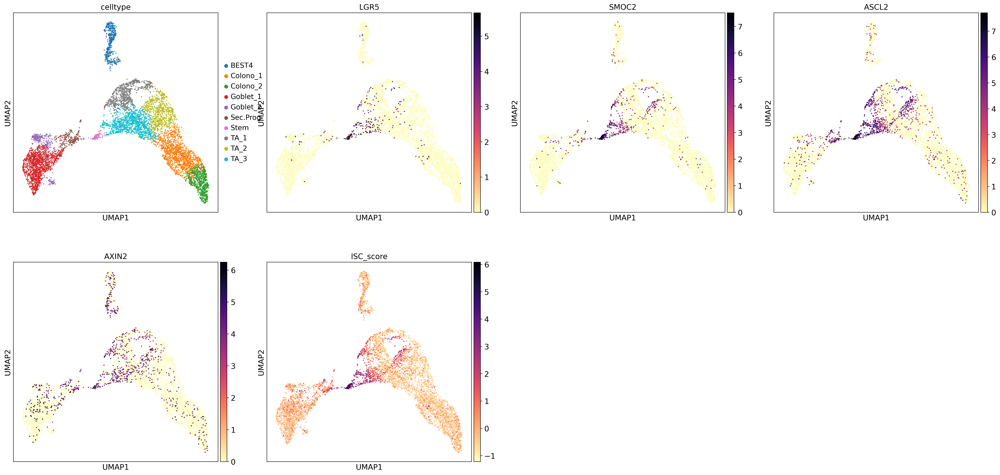

In [13]:
sc.set_figure_params(figsize=(7, 7), dpi=180)
sc.pl.umap(adult_adata, color=['celltype', 'LGR5', 'SMOC2', 'ASCL2', 'AXIN2', 'ISC_score'], color_map='magma_r')

In [14]:
adult_adata.obs['LGR5+'] = adult_adata.obs['LGR5_score'] > 3
adult_adata.obs['ISC_high'] = adult_adata.obs['ISC_score'] > 3

In [15]:
adult_adata.obs['LGR5+'] = adult_adata.obs['LGR5+'].astype(str)
adult_adata.obs['ISC_high'] = adult_adata.obs['ISC_high'].astype(str)
adult_adata.obs['celltype'] = adult_adata.obs['celltype'].astype(str)
adult_adata.obs['extended_annotation'] = adult_adata.obs['celltype'] + '_' + adult_adata.obs['LGR5+'] + '_' + adult_adata.obs['ISC_high']

In [16]:
adult_adata.obs.loc[adult_adata.obs['extended_annotation'] == 'Stem_True_True', 'celltype'] = 'LGR5_high_stem_cell'
adult_adata.obs.loc[adult_adata.obs['celltype'] == 'TA_1', 'celltype'] = 'TA'
adult_adata.obs.loc[adult_adata.obs['celltype'] == 'TA_2', 'celltype'] = 'TA'
adult_adata.obs.loc[adult_adata.obs['celltype'] == 'TA_3', 'celltype'] = 'TA'

+ Extract signature stem cells genes from Ishikawa, 2022 study

In [27]:
sc.tl.rank_genes_groups(adult_adata, groupby="celltype", method='wilcoxon', n_genes=100)
adult_df = sc.get.rank_genes_groups_df(adult_adata, group=None)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


In [17]:
sc.tl.rank_genes_groups(adult_adata, groupby="celltype", method='logreg', n_genes=100)
adult_df = sc.get.rank_genes_groups_df(adult_adata, group=None)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [28]:
adult_df

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,BEST4,SPIB,35.302067,10.121394,5.458926e-273,1.830815e-268
1,BEST4,FKBP1A,34.537823,3.031940,2.171570e-261,3.641506e-257
2,BEST4,CA7,32.336414,9.821992,2.153657e-229,2.407645e-225
3,BEST4,CTSE,31.836678,9.228418,2.012660e-222,1.687515e-218
4,BEST4,CEACAM5,29.760511,3.546949,1.267926e-194,8.504740e-191
...,...,...,...,...,...,...
895,TA,CENPN,34.431469,3.712990,8.529107e-260,2.364043e-257
896,TA,SNRPE,34.338173,1.425356,2.115020e-258,5.720448e-256
897,TA,LSM4,34.081017,1.500366,1.409768e-254,3.752444e-252
898,TA,SET,34.006607,2.330650,1.779134e-253,4.698314e-251


In [18]:
lgr5_high_stem_cell = adult_df[adult_df['group'] == 'LGR5_high_stem_cell']
lgr5_high_stem_cell_genes = lgr5_high_stem_cell['names'].tolist()

In [19]:
TA = adult_df[adult_df['group'] == 'TA']
TA_genes = TA['names'].tolist()

In [20]:
lgr5_low_stem_cell = adult_df[adult_df['group'] == 'Stem']
lgr5_low_stem_cell_genes = lgr5_low_stem_cell['names'].tolist()

### Score signatures to fetal cells

+ Load fetal cells

In [21]:
fetal_adata = sc.read_h5ad("data/Fetal_cells_filtered_raw.h5ad")

+ Normalize fetal cells

In [22]:
fetal_adata_log = fetal_adata.copy()
sc.pp.normalize_total(fetal_adata_log, target_sum = 1e6, exclude_highly_expressed = True) #1e6 because it is 10X
sc.pp.log1p(fetal_adata_log)

In [23]:
fetal_adata_log = fetal_adata_log[fetal_adata_log.obs['Cell States'].isin(['MTRNR2L12+ASS1+_SC', 'TA', 'RPS10+_RPS17+_SC',
                                                                           'FXYD3+_CKB+_SC'])]

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [24]:
sc.tl.score_genes(fetal_adata_log, gene_list=lgr5_high_stem_cell_genes, score_name='lgr5_positive_score')
sc.tl.score_genes(fetal_adata_log, gene_list=lgr5_low_stem_cell_genes, score_name='lgr5_low_score')
sc.tl.score_genes(fetal_adata_log, gene_list=TA_genes, score_name='ta_score')

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated 

In [25]:
sc.set_figure_params(dpi=300, figsize=(10, 10))
sc.pl.violin(fetal_adata_log, keys=['lgr5_positive_score', 'lgr5_low_score', 'ta_score'], groupby='Cell States', stripplot=True, inner="quartile")

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/amaguza/miniforge3/envs/scanpy_env/lib/python